<a href="https://colab.research.google.com/github/BharathMenon/ML_work/blob/main/ImageCaptionGenerator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os   # handling the files
import pickle # storing numpy features
import numpy as np
from tqdm.notebook import tqdm # how much data is process till now

from tensorflow.keras.applications.vgg16 import VGG16 , preprocess_input # extract features from image data.
from tensorflow.keras.preprocessing.image import load_img , img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input , Dense , LSTM , Embedding , Dropout , add

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/kaggle.json

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json #Enable permissions

In [ ]:
!kaggle datasets download -d adityajn105/flickr8k

 99% 1.03G/1.04G [00:09<00:00, 45.7MB/s]
100% 1.04G/1.04G [00:09<00:00, 120MB/s] 


In [ ]:
!unzip flickr8k.zip

Streaming output truncated to the last 5000 lines.
  inflating: Images/2844846111_8c1cbfc75d.jpg  
  inflating: Images/2844963839_ff09cdb81f.jpg  
  inflating: Images/2845246160_d0d1bbd6f0.jpg  
  inflating: Images/2845691057_d4ab89d889.jpg  
  inflating: Images/2845845721_d0bc113ff7.jpg  
  inflating: Images/2846037553_1a1de50709.jpg  
  inflating: Images/2846785268_904c5fcf9f.jpg  
  inflating: Images/2846843520_b0e6211478.jpg  
  inflating: Images/2847514745_9a35493023.jpg  
  inflating: Images/2847615962_c330bded6e.jpg  
  inflating: Images/2847859796_4d9cb0d31f.jpg  
  inflating: Images/2848266893_9693c66275.jpg  
  inflating: Images/2848571082_26454cb981.jpg  
  inflating: Images/2848895544_6d06210e9d.jpg  
  inflating: Images/2848977044_446a31d86e.jpg  
  inflating: Images/2849194983_2968c72832.jpg  
  inflating: Images/2850719435_221f15e951.jpg  
  inflating: Images/2851198725_37b6027625.jpg  
  inflating: Images/2851304910_b5721199bc.jpg  
  inflating: Images/2851931813_eaf8ed

In [ ]:
working_dir = "/content"

In [ ]:
# Load vgg16 Model
model = VGG16()

# restructure model
model = Model(inputs = model.inputs , outputs = model.layers[-2].output)

# Summerize
print(model.summary())

553467096/553467096 [==============================] - 6s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
features = {}
directory = "/content/Images"
for img_name in tqdm(os.listdir(directory)):
  img_path = directory + '/' + img_name
  image = load_img(img_path,target_size=(224,224))
  image = img_to_array(image)
  image = image.reshape((1,image.shape[0],image.shape[1],image.shape[2]))
  image = preprocess_input(image)
  feature = model.predict(image,verbose=0)
  image_id = img_name.split('.')[0]
  features[image_id] = feature

  0%|          | 0/8091 [00:00<?, ?it/s]

In [ ]:
# store features in pickle
pickle.dump(features, open(os.path.join(working_dir, 'features.pkl'), 'wb'))

In [ ]:
# load features from pickle
with open(os.path.join(working_dir, 'features.pkl'), 'rb') as f:
    features = pickle.load(f)

In [ ]:
with open(os.path.join(working_dir, 'captions.txt'), 'r') as f:
    next(f) #skips first line as contains headers
    captions_doc = f.read()

In [ ]:
mapping = {}
for line in tqdm(captions_doc.split('\n')):
  tokens = line.split(',')
  if len(line)<2:
    continue
  image_id,caption = tokens[0],tokens[1:]
  image_id = image_id.split('.')[0]
  caption = " ".join(caption)
  if image_id not in mapping:
    mapping[image_id] = []
  mapping[image_id].append(caption)

  0%|          | 0/40456 [00:00<?, ?it/s]

In [ ]:
len(mapping)

8091

In [ ]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            # take one caption at a time
            caption = captions[i]
            # preprocessing steps
            # convert to lowercase
            caption = caption.lower()
            # delete digits, special chars, etc.,
            caption = caption.replace('[^A-Za-z]', '')
            # delete additional spaces
            caption = caption.replace('\s+', ' ')
            # add start and end tags to the caption
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
            captions[i] = caption

In [ ]:
mapping['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [ ]:
clean(mapping)
mapping['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

In [ ]:
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [ ]:
len(all_captions)

40455

In [ ]:
all_captions[:10]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq',
 'startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tri-colored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq']

In [ ]:
tok = Tokenizer()
tok.fit_on_texts(all_captions)
vocab_size = len(tok.word_index) + 1 #For the special case that will handle out of vocabulary words

In [ ]:
vocab_size

8485

In [ ]:
max_len = max(len(caption.split()) for caption in all_captions)
max_len

35

In [ ]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
ns = int(len(image_ids)*0.05)
test = image_ids[split:split+ns+1]

In [ ]:
def data_generator(data_keys,mapping,features,tokenizer,max_length,vocab_sze,batch_size):
  x1,x2,y = list(),list(),list()
  n = 0
  while 1:
    for key in data_keys:
      n += 1
      captions = mapping[key]
      for caption in captions:
        seq = tokenizer.texts_to_sequences([caption])[0]
        for i in range(1, len(seq)):
                    # split into input and output pairs
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq],num_classes=vocab_size)[0]
                    # store the sequences
                    x1.append(features[key][0])
                    x2.append(in_seq) #Current sequence of words in a caption
                    y.append(out_seq) #One hot encoding of next word
      if n == batch_size:
                x1, x2, y = np.array(x1), np.array(x2), np.array(y)
                yield [x1, x2], y
                x1, x2, y = list(), list(), list()
                n = 0

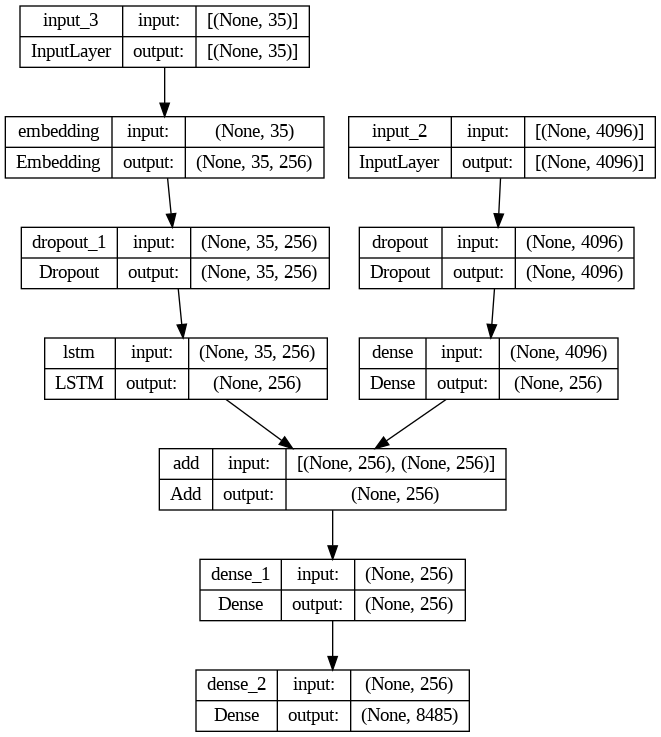

In [ ]:
# encoder model
# image feature layers
inputs1 = Input(shape=(4096,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
# sequence feature layers
inputs2 = Input(shape=(max_len,))
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)

# decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam')

# plot the model
plot_model(model, show_shapes=True)

In [ ]:
epochs = 20
batch_size = 32
steps = len(train)//batch_size
for i in range(epochs):
  generator = data_generator(train, mapping, features, tok, max_len, vocab_size, batch_size)
  model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)

227/227 [==============================] - 88s 390ms/step - loss: 2.2060


In [ ]:
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

In [ ]:
def predict_caption(model, image, tokenizer, max_length):
    # add start tag for generation process
    in_text = 'startseq'
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([image, sequence], verbose=0)
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        word = idx_to_word(yhat, tokenizer)
        # stop if word not found
        if word is None:
            break
        # append word as input for generating next word
        in_text += " " + word
        # stop if we reach end tag
        if word == 'endseq':
            break
    return in_text

In [ ]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

for key in tqdm(test):
    # get actual caption
    captions = mapping[key]
    # predict the caption for image
    y_pred = predict_caption(model, features[key], tok, max_len)
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)
# calcuate BLEU score
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))

  0%|          | 0/405 [00:00<?, ?it/s]

BLEU-1: 0.538306
BLEU-2: 0.321833


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
    image_id = image_name.split('.')[0]
    img_path = os.path.join(directory, image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('ACTUAL:\n')
    for caption in captions:
        print(caption)
    # predict the caption
    y_pred = predict_caption(model, features[image_id], tok, max_len)
    print('PREDICTED:\n')
    print(y_pred)
    plt.imshow(image)

ACTUAL:

startseq black dog and spotted dog are fighting endseq
startseq black dog and tri-colored dog playing with each other on the road endseq
startseq black dog and white dog with brown spots are staring at each other in the street endseq
startseq two dogs of different breeds looking at each other on the road endseq
startseq two dogs on pavement moving toward each other endseq
PREDICTED:

startseq two dogs are playing on the street endseq


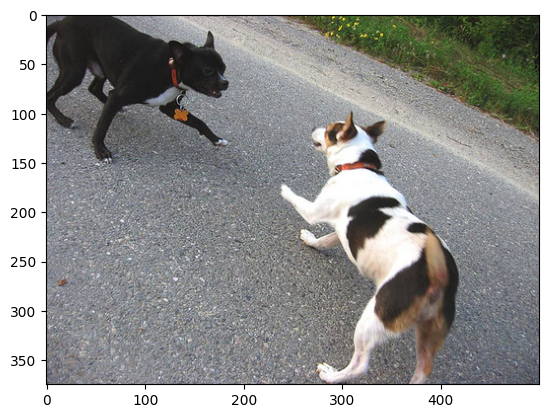

In [ ]:
generate_caption("1001773457_577c3a7d70.jpg")

In [ ]:
while True:
  print("Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!")

Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no th

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no th

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no the giving up kind!
Bharath has currently gone for dinner, but he continue after coming back, after all, he's no th